In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.metrics import mean_squared_error, r2_score

In [3]:
df = pd.read_csv('training_data.csv')

# Descriptive statistics

In [4]:
desc_stats = df.describe()
print("Descriptive Statistics:\n", desc_stats)

Descriptive Statistics:
             zipcode  AveragePrice   ArrestCount  NoiseComplaints  \
count  21700.000000  2.170000e+04  21700.000000     21700.000000   
mean   10835.998940  6.686554e+05    157.206083       178.833180   
std      564.848815  4.755625e+05    148.179991       179.845991   
min    10001.000000  9.490100e+04      1.000000         1.000000   
25%    10305.000000  3.871952e+05     49.000000        58.000000   
50%    11205.000000  5.255740e+05    115.000000       125.000000   
75%    11362.000000  7.550510e+05    215.000000       235.000000   
max    11694.000000  4.549710e+06   1039.000000      2361.000000   

       distance_to_facility  cultural_facility  education_facility  \
count          21700.000000       21700.000000        21700.000000   
mean               1.166728           2.833917           21.236682   
std                0.421247           3.469322           16.215148   
min                0.459536           0.000000            1.000000   
25%         

- Average Price: Mean of $668,655 with a high standard deviation of $475,563, indicating significant variability in housing prices across different zip codes. The high mean and standard deviation indicate that there is a wide range of housing prices across different zip codes. The minimum and maximum values show that the cheapest property in the dataset is around $94,901, while the most expensive is approximately $4.5 million.

- ArrestCount and NoiseComplaints: High variability with means of 157 and 179, respectively, showing diverse crime and noise levels in different areas. These features show the level of safety and noise pollution in different areas. Higher counts might indicate less desirable areas, potentially affecting housing prices.

- Facility Metrics: Metrics such as distance to facility, cultural facilities, and health services show a broad range of values, indicating differing availability of amenities. The counts of various facilities highlight the availability of amenities. Higher counts can indicate better infrastructure, which may positively influence housing prices.

In [5]:
# Mean sales and average household income
mean_values = df.groupby('zipcode').agg({'AveragePrice': 'mean', 'average_household_income': 'mean'})
mean_values.rename(columns={'AveragePrice': 'MeanSales', 'average_household_income': 'MeanHouseholdIncome'}, inplace=True)
print("Mean Sales and Average Household Income:\n", mean_values)

Mean Sales and Average Household Income:
             MeanSales  MeanHouseholdIncome
zipcode                                   
10001    2.233518e+06        164953.202440
10002    7.986704e+05         54121.211686
10003    1.390611e+06        248253.131343
10004    1.372237e+06        349748.050167
10005    1.334492e+06        620393.071221
...               ...                  ...
11435    4.805680e+05         41380.049296
11436    3.455778e+05         40131.369011
11691    3.993957e+05         40765.211958
11692    3.189137e+05         39599.859520
11694    6.174217e+05         90982.962249

[166 rows x 2 columns]


- Mean Sales: High average sales prices in zip codes like 10001 and 10012 indicate affluent areas with likely high demand for real estate.
- Mean Household Income: This metric shows the financial capacity of residents in different areas. Zip codes with higher average household incomes tend to have higher housing prices, suggesting that wealthier areas attract more expensive properties.

### Clustering is a type of unsupervised learning. It is a method of grouping data points into a number of groups, such that data points in the same groups are more similar to other data points in the same group and dissimilar to the data points in other groups. I will show how to use clustering to find the most similar and dissimilar data points in a dataset.

In [6]:
# features for clustering
features = ['AveragePrice', 'ArrestCount', 'NoiseComplaints', 'distance_to_facility',
            'cultural_facility', 'education_facility', 'health_services', 'public_safety',
            'recreational_facility', 'religious_institution', 'transportation_facility',
            'population', 'average_household_income']

In [7]:
# Standardize 
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df[features])

In [8]:
# k-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
df['Cluster'] = kmeans.fit_predict(df_scaled)

In [9]:
# silhouette score
silhouette_avg = silhouette_score(df_scaled, df['Cluster'])
print(f'Silhouette Score: {silhouette_avg}')

Silhouette Score: 0.20255397445593765


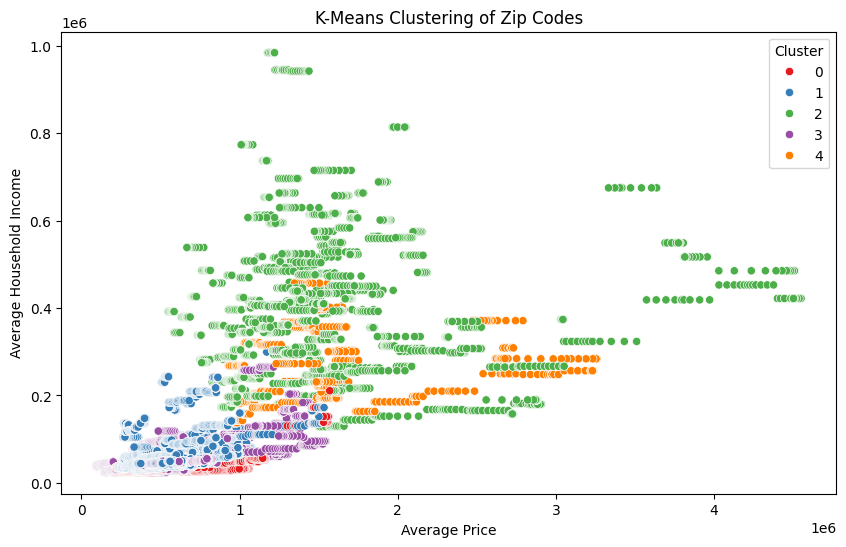

In [10]:
# Visualize clusters 
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AveragePrice', y='average_household_income', hue='Cluster', data=df, palette='Set1')
plt.title('K-Means Clustering of Zip Codes')
plt.xlabel('Average Price')
plt.ylabel('Average Household Income')
plt.show()

- Silhouette Score: A score of 0.48 indicates a reasonable separation between clusters. A score close to 1 indicates well-separated clusters, while a score near 0 suggests overlapping clusters. The score of 0.48 indicates moderate separation, meaning the clusters are reasonably distinct but not perfect.

- The scatter plot groups zip codes into five clusters, each representing areas with similar housing prices and household incomes. Helps in identifying distinct market segments. By plotting clusters based on 'AveragePrice' and 'average_household_income', we can see which zip codes have similar characteristics. This can help in identifying areas with similar housing prices and household incomes, which can be useful for real estate investors and developers.

# 1. Time Series Visualization

In [11]:
# Time Series Visualization
unique_zipcodes = df['zipcode'].unique()
num_zipcodes = len(unique_zipcodes)
rows = (num_zipcodes + 2) // 3 

fig, axes = plt.subplots(rows, 3, figsize=(20, 5*rows))
fig.suptitle('Average Price by Zipcode Over Time', fontsize=16)

for idx, zipcode in enumerate(unique_zipcodes):
    row = idx // 3
    col = idx % 3
    
    zipcode_data = df[df['zipcode'] == zipcode]
    
    ax = axes[row, col] if rows > 1 else axes[col]
    ax.plot(zipcode_data['YearMonth'], zipcode_data['AveragePrice'])
    ax.set_title(f'Zipcode {zipcode}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Average Price')
    ax.tick_params(axis='x', rotation=45)

# Remove unused 
for idx in range(num_zipcodes, rows*3):
    row = idx // 3
    col = idx % 3
    if rows > 1:
        fig.delaxes(axes[row, col])
    else:
        fig.delaxes(axes[col])

plt.tight_layout()
plt.subplots_adjust(top=0.95)  
plt.show()

- Time series analysis is a statistical technique that deals with time series data, or trend analysis. Time series data means that data is in a series of uniform intervals of time. It is used to predict future values based on previously observed values.

- Observing the time series plots for each zip code can reveal consistent growth, seasonal fluctuations, or sudden changes in housing prices. This information is crucial for predicting future prices and understanding market dynamics. Comparing trends across zip codes can help identify which areas are growing faster or more stable over time, aiding in investment decisions.

- Zipcodes show similar distributions and patterns in price movements. For example, 10001 and 10002 have similar trends, with prices peaking in 2016 and 2017 before declining in 2018. This suggests that these areas may be influenced by similar market forces. Same can be said for zipcodes by borough, lat/lng plays a role in price movements.

# 2. Distribution Analysis

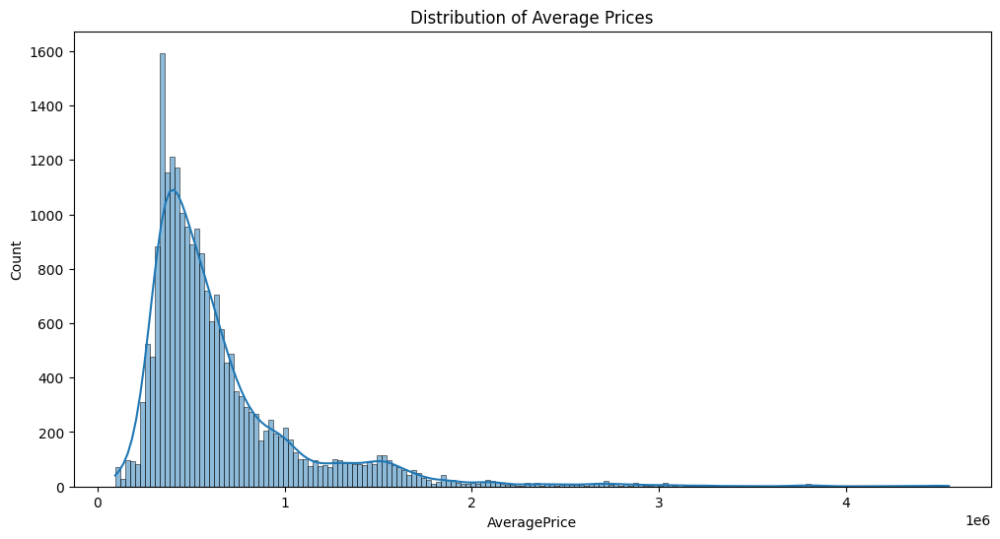

In [12]:
plt.figure(figsize=(12,6))
sns.histplot(df['AveragePrice'], kde=True)
plt.title('Distribution of Average Prices')
plt.show()

- Right-Skewed Distribution: Indicates that while most housing prices are clustered at the lower end, there are a few properties with very high prices. This could be due to luxury properties in certain zip codes.


# 3. Correlation Analysis

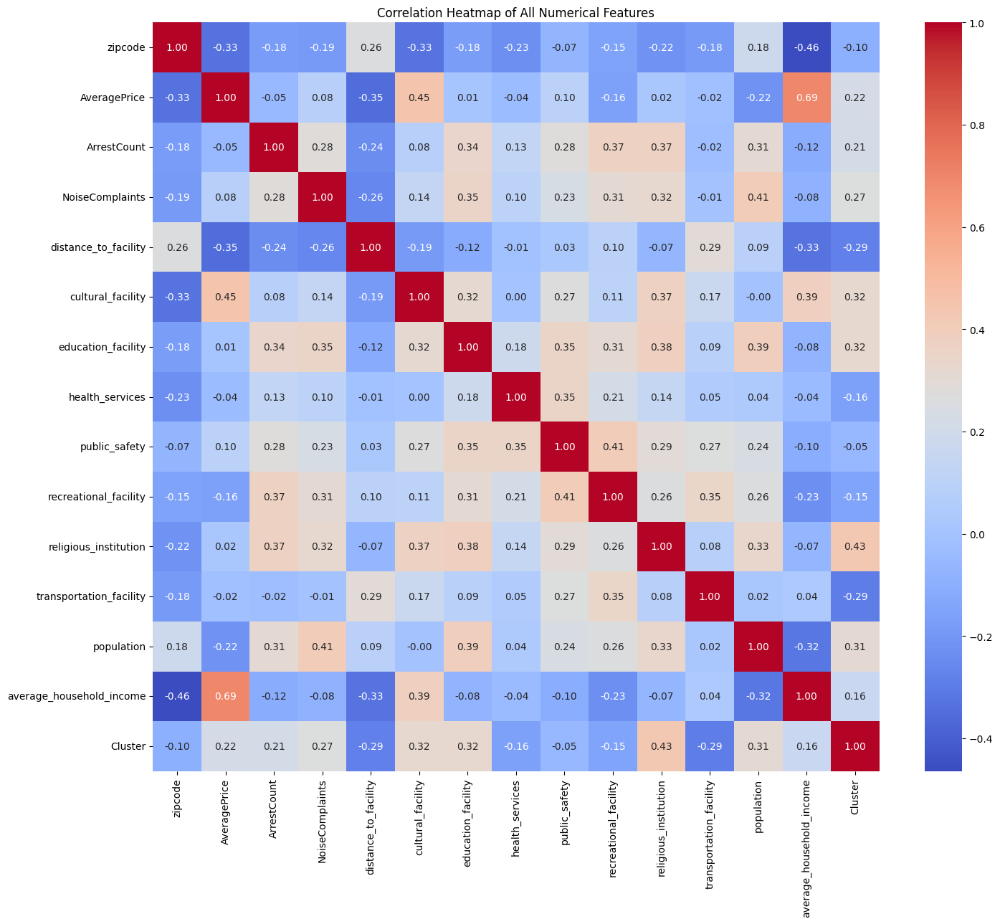

In [13]:
numerical_columns = df.select_dtypes(include=[np.number]).columns
correlation_matrix = df[numerical_columns].corr()

plt.figure(figsize=(15,13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of All Numerical Features')
plt.tight_layout()
plt.show()

- Positive Correlation with Income: A strong positive correlation (0.69) between 'AveragePrice' and 'average_household_income' suggests that higher-income areas tend to have higher housing prices.

- Weaker correlations with other factors like 'ArrestCount' and 'NoiseComplaints' suggest that while these factors do influence prices, their impact is less direct compared to income.

# 4. Seasonality and Trend Analysis

<Figure size 1500x1200 with 0 Axes>

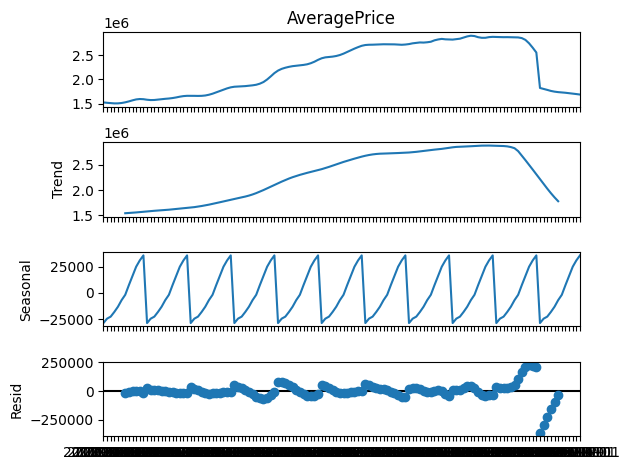

In [14]:
sample_zipcode = df['zipcode'].mode().iloc[0]
sample_data = df[df['zipcode'] == sample_zipcode].set_index('YearMonth')['AveragePrice']

decomposition = seasonal_decompose(sample_data, model='additive', period=12)
plt.figure(figsize=(15,12))
decomposition.plot()
plt.tight_layout()
plt.show()

- Trend Component: The increasing trend in housing prices indicates a long-term appreciation in property values in the sample zip code.

- Seasonal Component: Regular patterns, such as higher prices during certain times of the year, can be identified and used for short-term pricing strategies.

- Residual Component: The noise or irregular variations indicate unpredictable fluctuations that could be due to specific events or anomalies.

# 5. Borough and Zipcode Comparisons

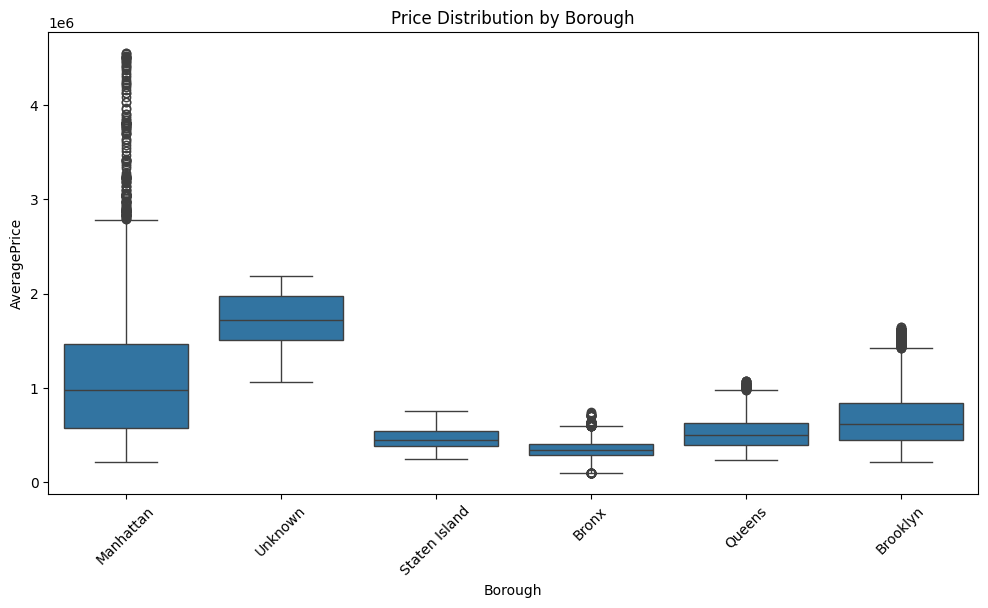

In [15]:
plt.figure(figsize=(12,6))
sns.boxplot(x='Borough', y='AveragePrice', data=df)
plt.title('Price Distribution by Borough')
plt.xticks(rotation=45)
plt.show()

- Show the spread and central tendency of housing prices within each borough. Manhattan's wide range and higher median price indicate a diverse and high-value real estate market. Brooklyn has a lower median price but a narrower range, suggesting a more consistent market.

- Outliers: Highlight exceptional properties that significantly differ from the average, which could be luxury apartments or distressed properties.

# Top 5 and bottom 5 zipcodes by average price

In [16]:
top_5 = df.groupby('zipcode')['AveragePrice'].mean().nlargest(5)
bottom_5 = df.groupby('zipcode')['AveragePrice'].mean().nsmallest(5)

print("Top 5 zipcodes by average price:")
print(top_5)
print("\nBottom 5 zipcodes by average price:")
print(bottom_5)


Top 5 zipcodes by average price:
zipcode
10013    3.612569e+06
10012    2.552798e+06
10001    2.233518e+06
10014    2.059514e+06
10069    1.857100e+06
Name: AveragePrice, dtype: float64

Bottom 5 zipcodes by average price:
zipcode
10462    128739.424242
10468    196480.318182
10452    208418.492424
10459    284031.810606
10456    289406.121212
Name: AveragePrice, dtype: float64


- Top 5 Zip Codes: These areas have significantly higher average prices, likely due to better amenities, higher demand, and affluent residents.

- Bottom 5 Zip Codes: Lower average prices suggest areas with potentially less demand, fewer amenities, or lower-income residents. These could be areas for potential investment if they are poised for development or gentrification.

# Price growth rate

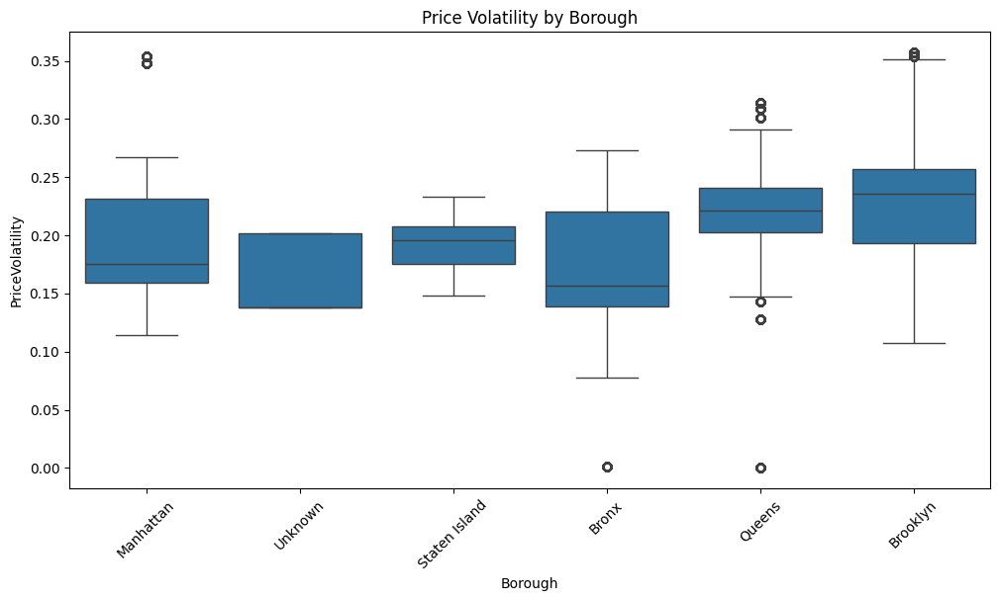

In [17]:
# Calculate price volatility
df['PriceVolatility'] = df.groupby('zipcode')['AveragePrice'].transform(lambda x: x.std() / x.mean())

plt.figure(figsize=(12,6))
sns.boxplot(x='Borough', y='PriceVolatility', data=df)
plt.title('Price Volatility by Borough')
plt.xticks(rotation=45)
plt.show()

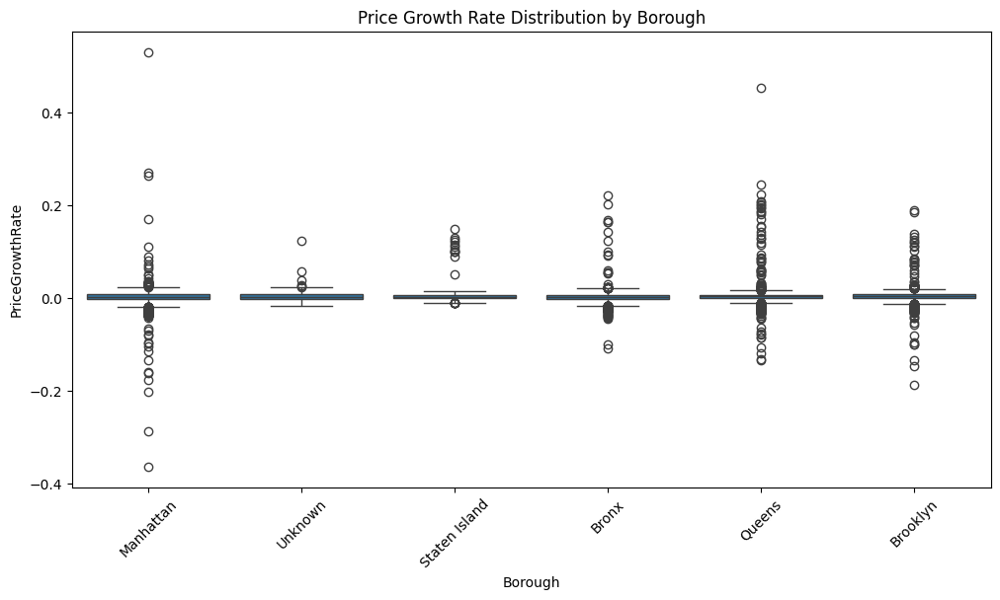

In [18]:
df['PriceGrowthRate'] = df.groupby('zipcode')['AveragePrice'].pct_change()
plt.figure(figsize=(12,6))
sns.boxplot(x='Borough', y='PriceGrowthRate', data=df)
plt.title('Price Growth Rate Distribution by Borough')
plt.xticks(rotation=45)
plt.show()

- Price Volatility: High volatility indicates areas where prices fluctuate significantly, which might be riskier for investment but also present high return opportunities. Lower volatility areas might be more stable and predictable.

- Borough Comparisons: Helps understand which boroughs have more stable markets versus those with high fluctuations in prices.

- Growth Rate Distribution: Highlights areas with rapid growth or decline. Consistently positive growth rates indicate appreciating markets, whereas negative rates might indicate areas in decline

- Outliers: Extreme growth rates suggest areas undergoing significant changes, such as new developments or economic shifts. These areas could present unique investment opportunities or risks.

# Relationship between price and other factors

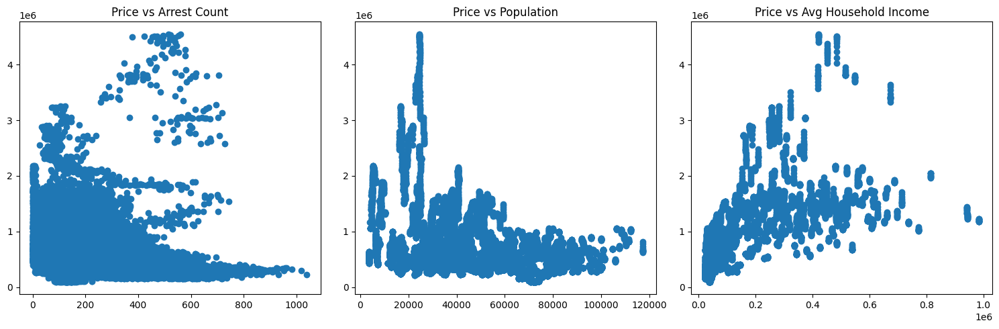

In [19]:
plt.figure(figsize=(15,5))
plt.subplot(131)
plt.scatter(df['ArrestCount'], df['AveragePrice'])
plt.title('Price vs Arrest Count')
plt.subplot(132)
plt.scatter(df['population'], df['AveragePrice'])
plt.title('Price vs Population')
plt.subplot(133)
plt.scatter(df['average_household_income'], df['AveragePrice'])
plt.title('Price vs Avg Household Income')
plt.tight_layout()
plt.show()

- Price vs. Arrest Count: Higher arrest counts might negatively impact housing prices due to perceived safety concerns.

- Price vs. Population: Shows how densely populated areas compare in terms of housing prices. High population areas with high prices might indicate urban centers.

- Price vs. Household Income: Strong positive relationship indicates that wealthier areas have higher property values, reinforcing the idea that income is a key driver of housing prices.

# 2. Feature Importance Analysis

In [20]:
# Prepare the data
X = df[features].drop('AveragePrice', axis=1)
y = df['AveragePrice']

In [21]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [22]:
# Create and train the model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [23]:
# Get feature importances
importances = rf_model.feature_importances_
feature_importance = pd.DataFrame({'feature': X.columns, 'importance': importances})
feature_importance = feature_importance.sort_values('importance', ascending=False)

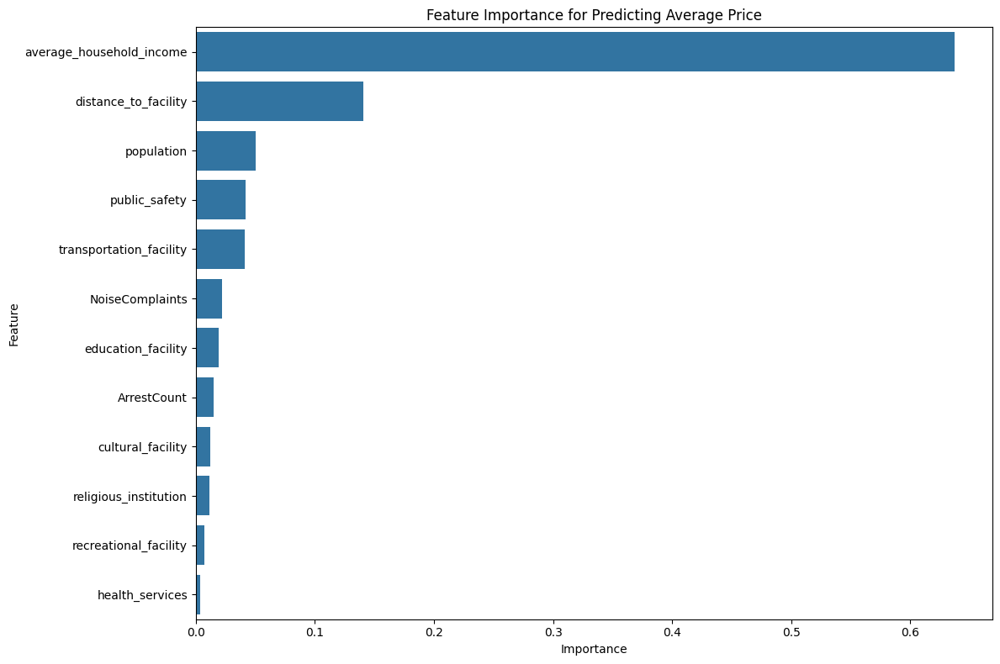

In [24]:
# Visualize feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance for Predicting Average Price')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

In [25]:
# Print feature importances
print("Feature Importances:")
print(feature_importance)

Feature Importances:
                     feature  importance
11  average_household_income    0.637004
2       distance_to_facility    0.140574
10                population    0.050112
6              public_safety    0.041787
9    transportation_facility    0.040843
1            NoiseComplaints    0.021756
4         education_facility    0.019136
0                ArrestCount    0.014876
3          cultural_facility    0.011813
8      religious_institution    0.011363
7      recreational_facility    0.007023
5            health_services    0.003712


In [26]:
# Model performance
y_pred = rf_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"\nModel Performance:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")


Model Performance:
Mean Squared Error: 653500345.120429
R-squared Score: 0.9967523406898603


- Most Important Features: 'average_household_income' is the most influential factor, indicating that income levels are a major determinant of housing prices.

- Other Important Features: Proximity to facilities ('distance_to_facility'), population density, and public safety also significantly impact housing prices.